In [1]:
import numpy as np
import matplotlib.pyplot as plt

# Define material properties
materials = [
    {"name": "Aluminum", "k": 205, "rho": 2700, "cp": 900, "thickness": 0.1},  # meters
    {"name": "Insulation", "k": 0.04, "rho": 30, "cp": 1030, "thickness": 0.01},
    {"name": "Steel", "k": 50, "rho": 7850, "cp": 500, "thickness": 0.1}
]


## For a 1D steady-state model, you can compute the overall thermal resistance 

In [2]:
R_total = sum(layer["thickness"] / layer["k"] for layer in materials)
h_eff = 1 / R_total
print(f"Effective heat transfer coefficient: {h_eff:.2f} W/m²K")


Effective heat transfer coefficient: 3.96 W/m²K


## Now set up the simulation

In [3]:
#this is intensive and preformed on the local PC

# --- Discretize space ---
dx = 1e-3  # 1 mm resolution
layers = []
for mat in materials:
    N = int(mat["thickness"] / dx)
    alpha = mat["k"] / (mat["rho"] * mat["cp"])
    layers.extend([alpha] * N)

alpha_array = np.array(layers)
x = np.linspace(0, sum(m["thickness"] for m in materials), len(alpha_array))

# --- Time discretization ---
dt = 0.25 * dx**2 / np.max(alpha_array)  # Stability condition
total_time = 30  # seconds
Nt = int(total_time / dt)

# --- Initial condition ---
T = np.ones_like(alpha_array) * 300.0  # Initial temp in K

# --- Boundary and driving conditions ---
def left_bc(t):
    # Example: sinusoidal heating on the left boundary
    return 300 + 50 * np.sin(2 * np.pi * 0.1 * t)  # 0.1 Hz, 50 K amplitude

right_bc = 300  # Constant temp on right

# --- Storage for plotting ---
frames = []

# --- Time evolution ---
for n in range(Nt):
    T_new = T.copy()
    for i in range(1, len(T) - 1):
        T_new[i] = T[i] + alpha_array[i] * dt / dx**2 * (T[i+1] - 2*T[i] + T[i-1])
    
    # Boundary conditions
    T_new[0] = left_bc(n * dt)
    T_new[-1] = right_bc

    T = T_new.copy()
    
    # Save snapshots
    if n % int(0.1 / dt) == 0:  # Save every 0.1s
        frames.append(T.copy())


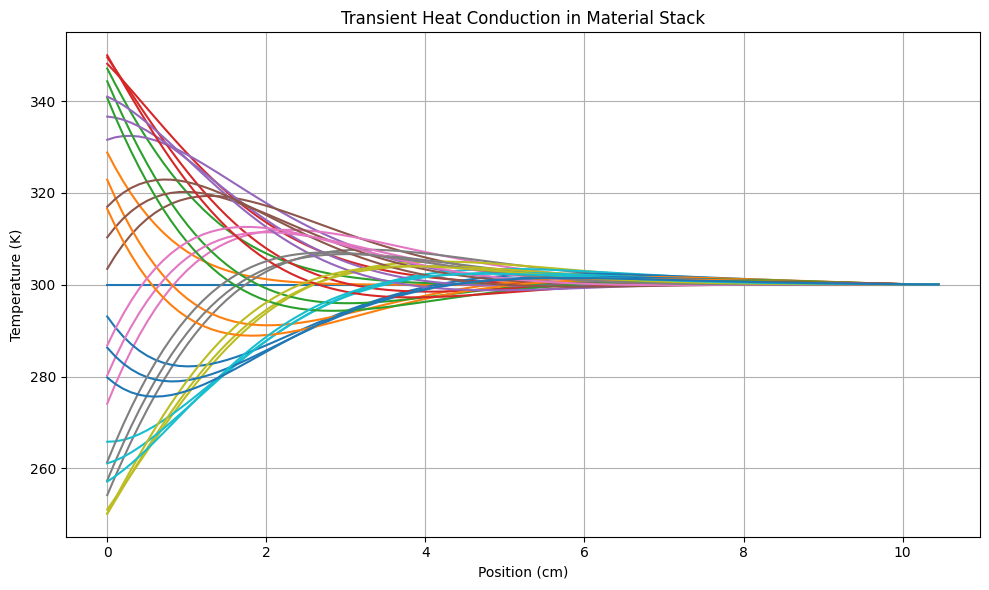

In [4]:
# --- Plotting ---
plt.figure(figsize=(10, 6))
for i, frame in enumerate(frames[::10]):
    plt.plot(x[0:int(len(x)/2)] * 100, frame[0:int(len(x)/2):])

plt.xlabel("Position (cm)")
plt.ylabel("Temperature (K)")
plt.title("Transient Heat Conduction in Material Stack")
plt.grid(True)
plt.tight_layout()
plt.show()

## lets animate

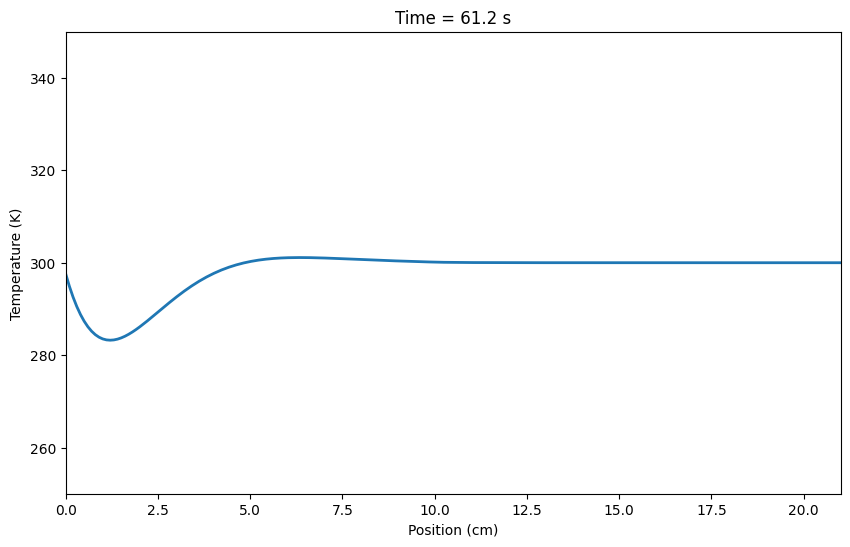

In [5]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(10, 6))
line, = ax.plot(x * 100, frames[0], lw=2)  # Start with first frame

ax.set_xlim(x[0] * 100, x[-1] * 100)
ax.set_ylim(np.min(frames), np.max(frames))
ax.set_xlabel("Position (cm)")
ax.set_ylabel("Temperature (K)")
title = ax.set_title("Heat Conduction Animation")

def update(frame_index):
    line.set_ydata(frames[frame_index])
    title.set_text(f"Time = {frame_index * 0.2:.1f} s")
    return line, title

ani = FuncAnimation(fig, update, frames=len(frames), interval=100, blit=True)

HTML(ani.to_jshtml())